In [272]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [273]:
import os
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

dog.jpg exists


In [274]:
import torchvision
img = torchvision.io.read_image("dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


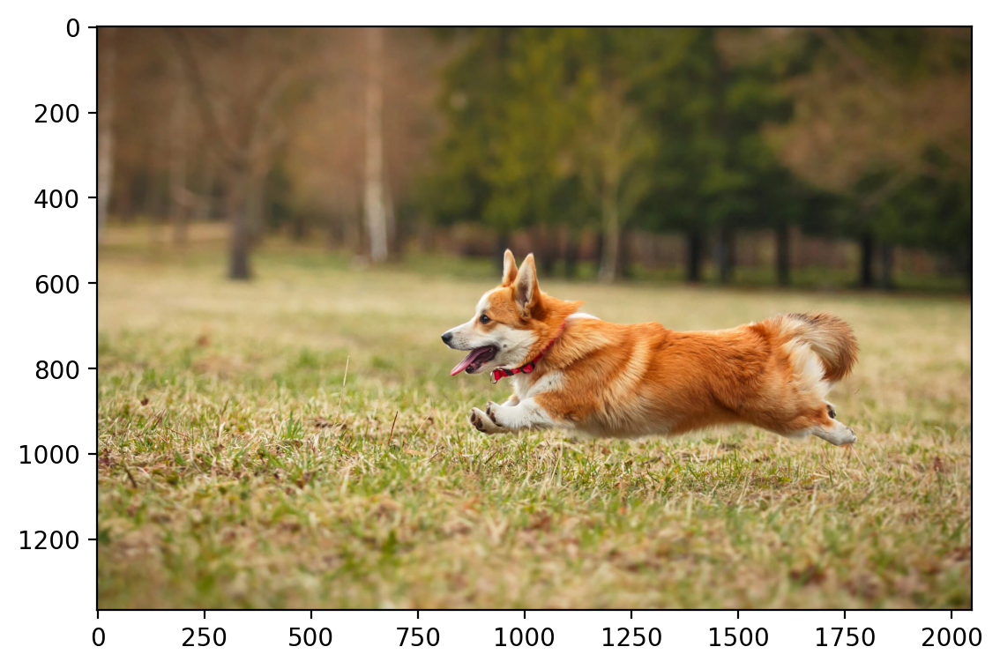

In [275]:
plt.imshow(img.permute(1, 2, 0).numpy())

In [276]:
crop = torchvision.transforms.functional.crop(img, 600, 800, 300, 300)
crop.shape

torch.Size([3, 300, 300])

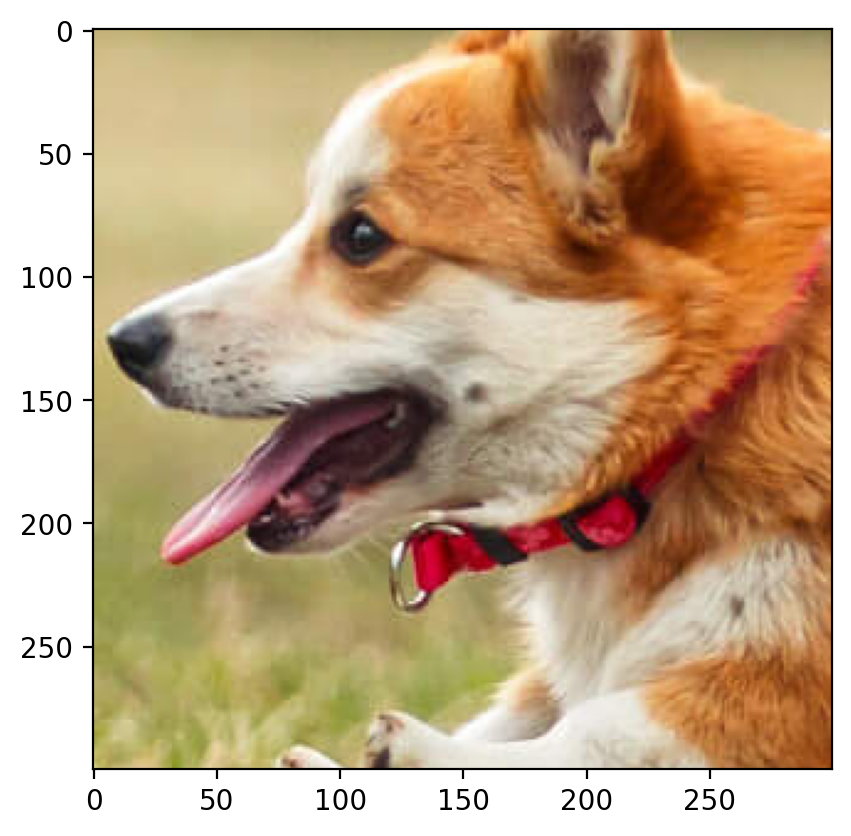

In [277]:
plt.imshow(crop.permute(1, 2, 0).numpy())

Text(0.5, 1.0, 'Patch 3')

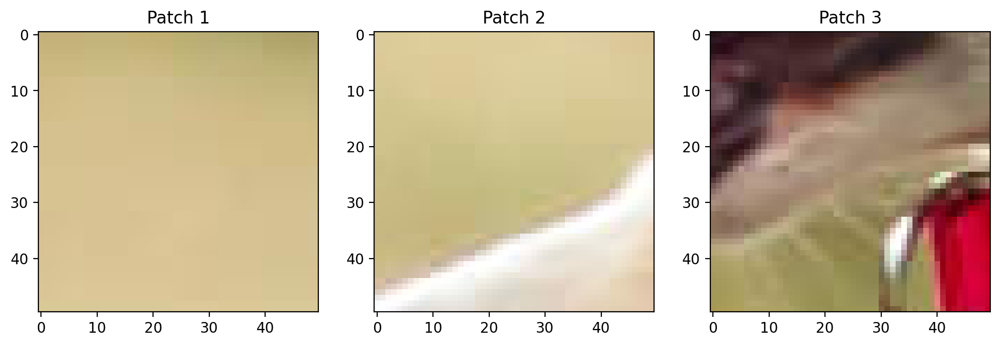

In [278]:
patch1 = torchvision.transforms.functional.crop(crop, 0, 0, 50, 50)
patch2 = torchvision.transforms.functional.crop(crop, 60, 30, 50, 50)
patch3 = torchvision.transforms.functional.crop(crop, 175, 90, 50, 50)

fig, axes = plt.subplots(1, 3, figsize=(12, 4)) 
axes[0].imshow(patch1.permute(1, 2, 0).numpy())
axes[0].set_title('Patch 1')
axes[1].imshow(patch2.permute(1, 2, 0).numpy())
axes[1].set_title('Patch 2')
axes[2].imshow(patch3.permute(1, 2, 0).numpy())
axes[2].set_title('Patch 3')

In [279]:
def factorize(A, k, device=torch.device("cpu")):
    A = A.to(device)
    W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
    H = torch.randn(k, A.shape[1], requires_grad=True, device=device)
    optimizer = optim.Adam([W, H], lr=0.01)
    mask = ~torch.isnan(A)
    for i in range(1000):
        diff_matrix = torch.mm(W, H) - A
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    return W, H

In [280]:
def compute_rmse(original, reconstructed):
    return np.sqrt(np.mean((original - reconstructed) ** 2))

In [281]:
def compute_psnr(original, reconstructed):
    mse = np.mean((original - reconstructed) ** 2)
    if mse == 0:
        return float('inf')
    pixel_max = 255.0  # Maximum pixel value
    return 20 * np.log10(pixel_max / np.sqrt(mse))

In [282]:
# Function to reconstruct patch using matrix factorization on each channel
def reconstruct_patch_color(W_r, H_r, W_g, H_g, W_b, H_b):
    recon_r = torch.mm(W_r, H_r).detach().cpu().numpy()
    recon_g = torch.mm(W_g, H_g).detach().cpu().numpy()
    recon_b = torch.mm(W_b, H_b).detach().cpu().numpy()
    
    # Stack channels back together into an RGB image
    reconstructed_patch = np.stack([recon_r, recon_g, recon_b], axis=2)
    return reconstructed_patch

In [283]:
def process_patch(patch, r_values, original_img, x_start, y_start):
    patch_np = patch.permute(1, 2, 0).numpy()
    original_img_np = original_img.permute(1, 2, 0).numpy()
    modified_img = np.copy(original_img_np)
    
    rmse_list = []
    psnr_list = []
    
    for r in r_values:
        patch_tensor_r = torch.tensor(patch_np[:, :, 0], dtype=torch.float32)
        patch_tensor_g = torch.tensor(patch_np[:, :, 1], dtype=torch.float32)
        patch_tensor_b = torch.tensor(patch_np[:, :, 2], dtype=torch.float32)
        
        W_r, H_r = factorize(patch_tensor_r, r)
        W_g, H_g = factorize(patch_tensor_g, r)
        W_b, H_b = factorize(patch_tensor_b, r)
        
        reconstructed_patch = reconstruct_patch_color(W_r, H_r, W_g, H_g, W_b, H_b)
        
        rmse = compute_rmse(patch_np, reconstructed_patch)
        psnr = compute_psnr(patch_np, reconstructed_patch)
        
        rmse_list.append(rmse)
        psnr_list.append(psnr)
        
        # Place the reconstructed patch into the copied image
        modified_img[y_start:y_start + 50, x_start:x_start + 50, :] = reconstructed_patch
        
        # Display original and modified images
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        ax[0].imshow(original_img_np / 255.0)
        ax[0].set_title('Original Image')
        ax[0].axis('off')
        
        ax[1].imshow(modified_img / 255.0)
        ax[1].set_title(f'Modified Image with Patch (r={r})')
        ax[1].axis('off')
        
        plt.show()
        
        print(f"Rank = {r} -> RMSE: {rmse:.4f}, PSNR: {psnr:.2f} dB")
    
    return rmse_list, psnr_list


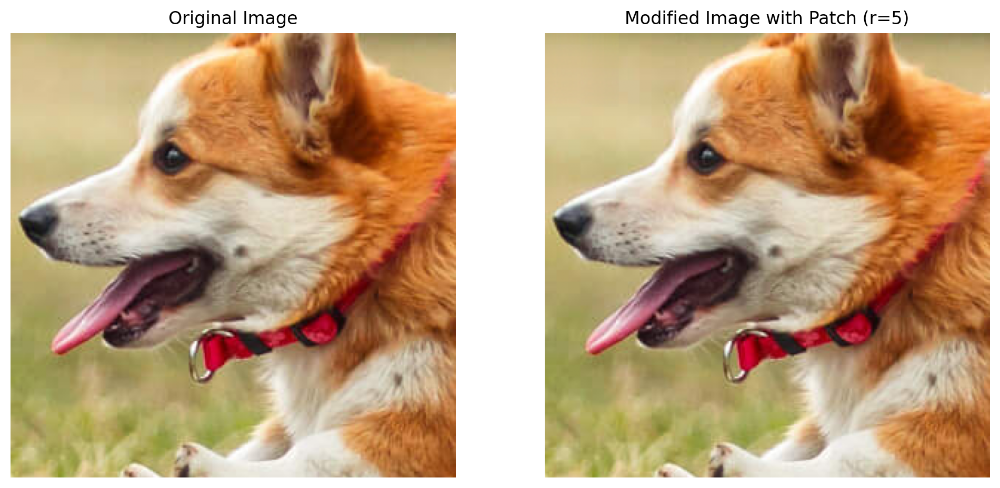

Rank = 5 -> RMSE: 1.8111, PSNR: 42.97 dB


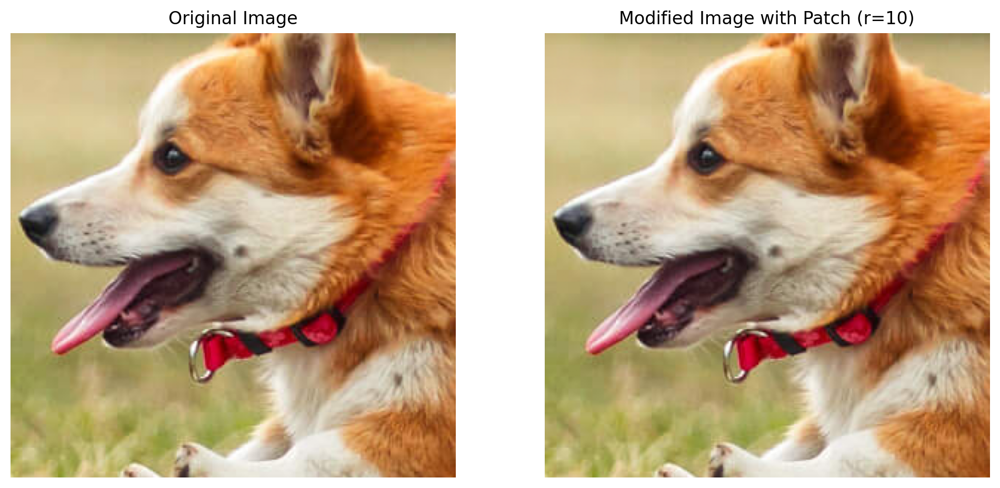

Rank = 10 -> RMSE: 0.7998, PSNR: 50.07 dB


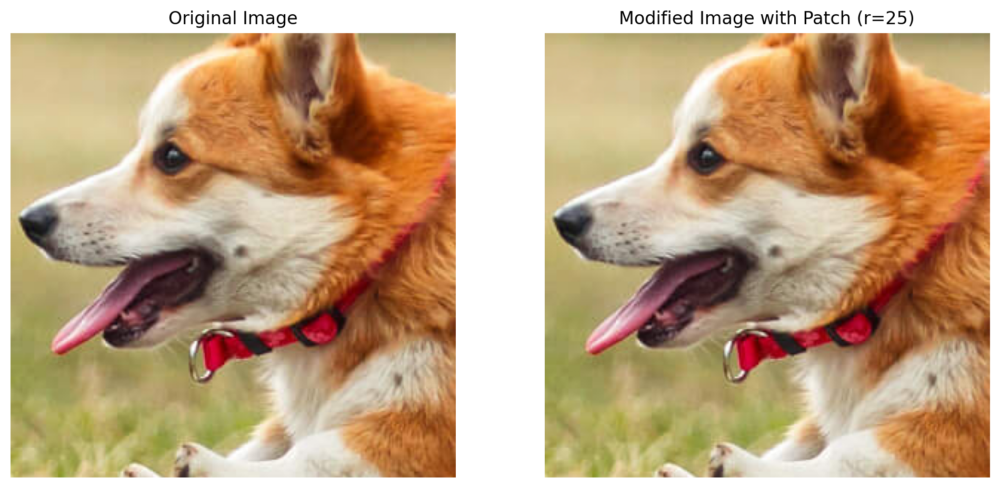

Rank = 25 -> RMSE: 0.1917, PSNR: 62.48 dB


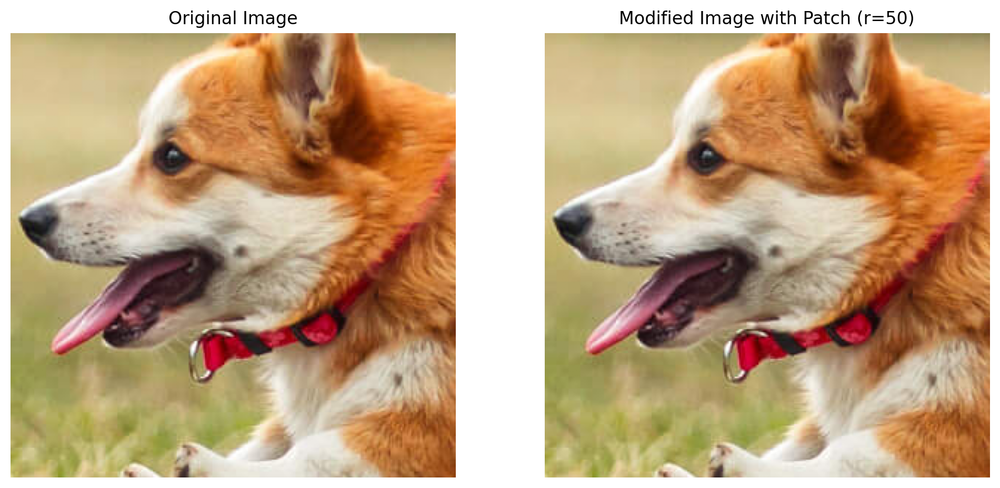

Rank = 50 -> RMSE: 0.0981, PSNR: 68.30 dB


([np.float32(1.8111022),
  np.float32(0.7998338),
  np.float32(0.19173893),
  np.float32(0.0980645)],
 [np.float32(42.971947),
  np.float32(50.07081),
  np.float32(62.476597),
  np.float32(68.30057)])

In [284]:

# Example usage
r_values = [5, 10, 25, 50]
patch = torchvision.transforms.functional.crop(crop, 0, 0, 50, 50)
process_patch(patch, r_values, crop, 0, 0)

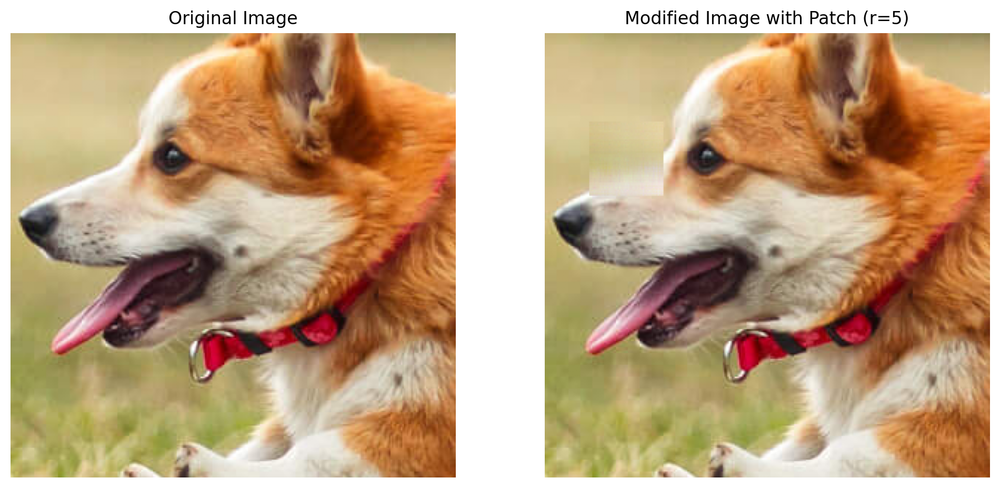

Rank = 5 -> RMSE: 17.1639, PSNR: 23.44 dB


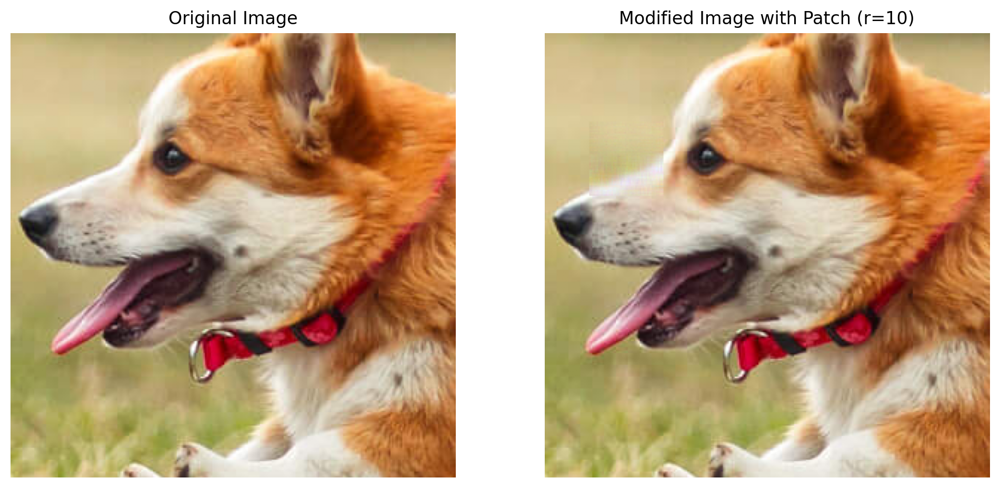

Rank = 10 -> RMSE: 9.0863, PSNR: 28.96 dB


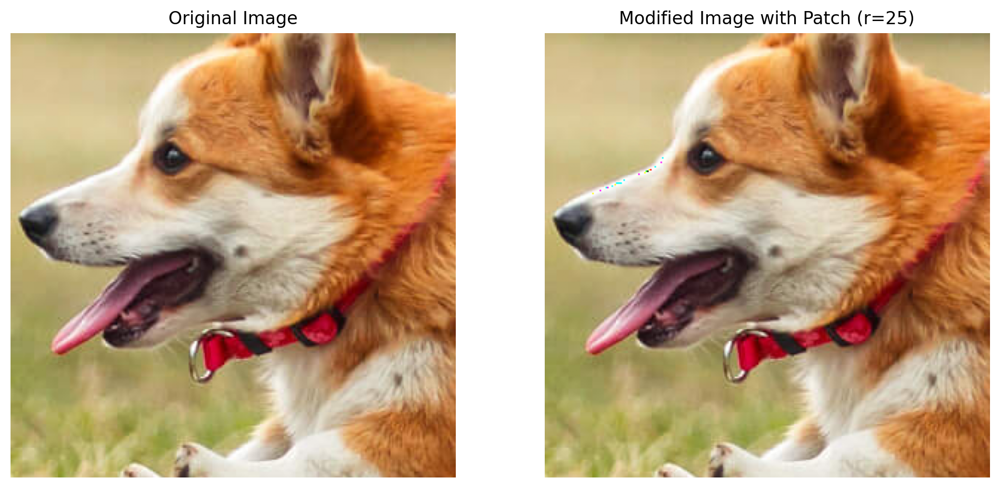

Rank = 25 -> RMSE: 0.8777, PSNR: 49.26 dB


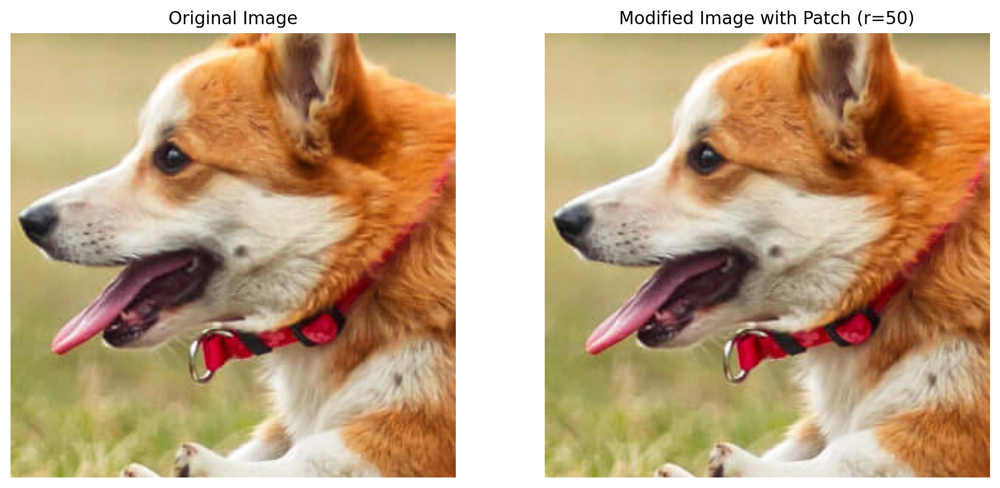

Rank = 50 -> RMSE: 0.1322, PSNR: 65.71 dB


([np.float32(17.163881),
  np.float32(9.086336),
  np.float32(0.8776694),
  np.float32(0.13219938)],
 [np.float32(23.438494),
  np.float32(28.963028),
  np.float32(49.264183),
  np.float32(65.706215)])

In [285]:

# Example usage
r_values = [5, 10, 25, 50]
patch = torchvision.transforms.functional.crop(crop, 60, 30, 50, 50)
process_patch(patch, r_values, crop, 30, 60)

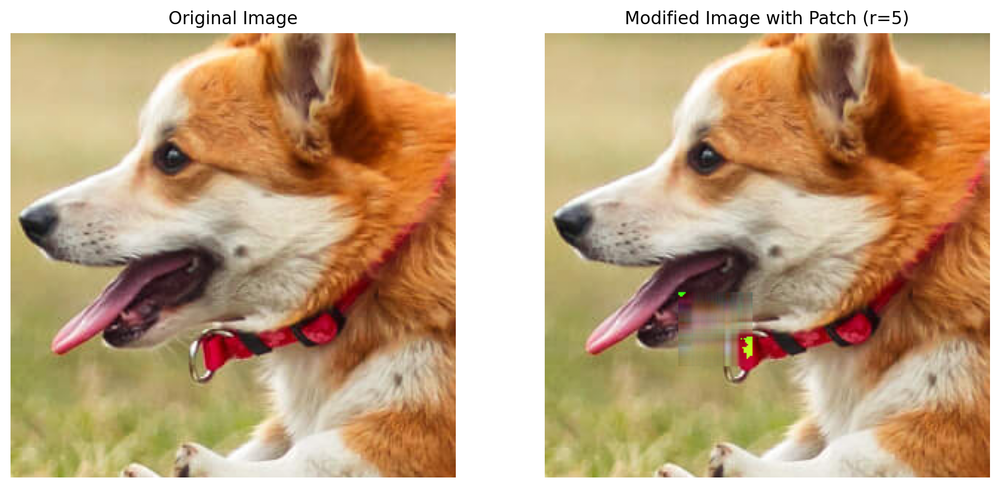

Rank = 5 -> RMSE: 20.1718, PSNR: 22.04 dB


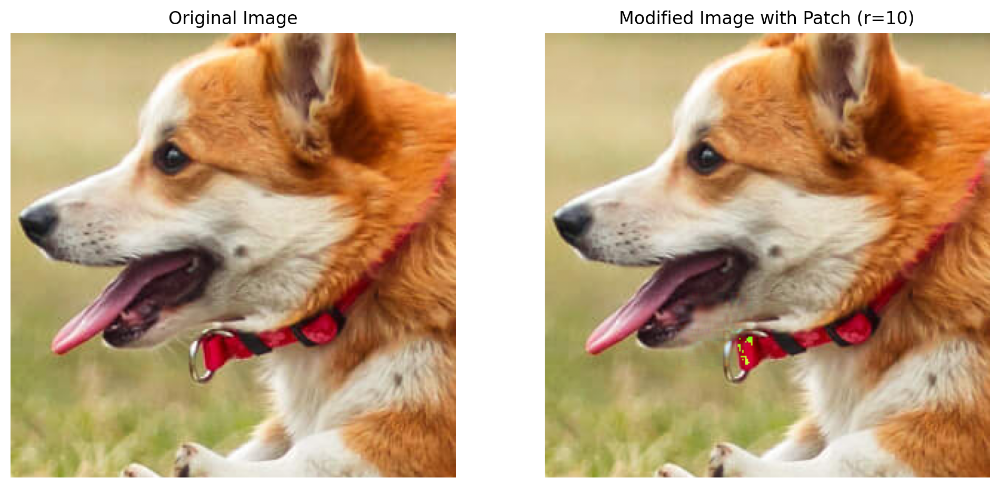

Rank = 10 -> RMSE: 9.2643, PSNR: 28.79 dB


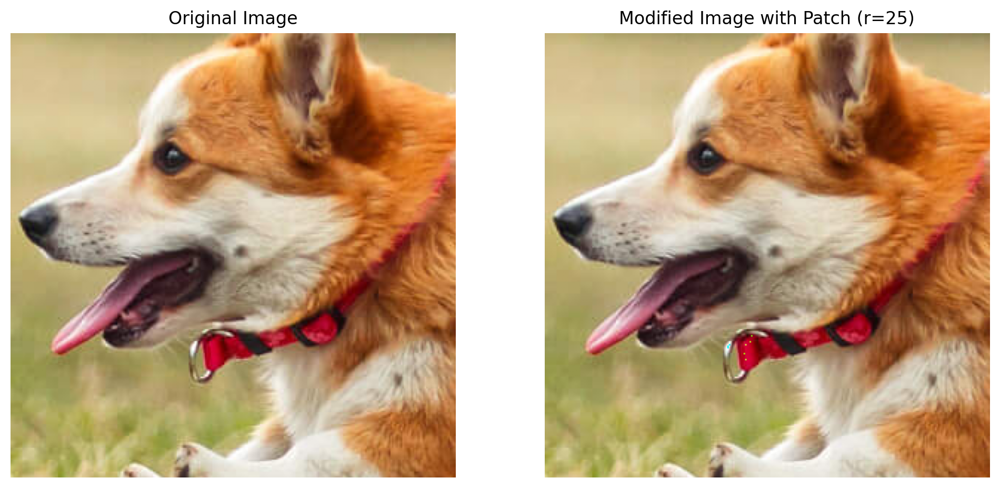

Rank = 25 -> RMSE: 0.8254, PSNR: 49.80 dB


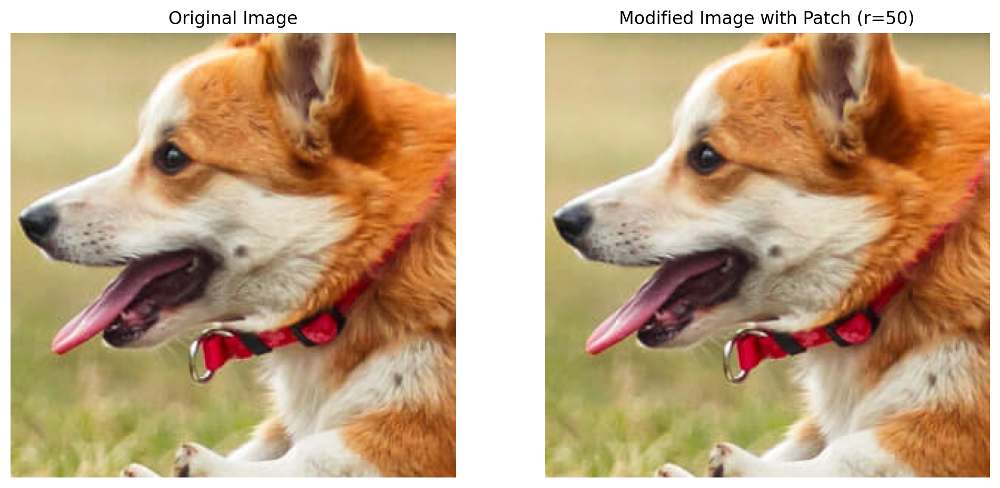

Rank = 50 -> RMSE: 0.0880, PSNR: 69.24 dB


([np.float32(20.171772),
  np.float32(9.264282),
  np.float32(0.8253721),
  np.float32(0.087994896)],
 [np.float32(22.035923),
  np.float32(28.794567),
  np.float32(49.797806),
  np.float32(69.24165)])

In [286]:

# Example usage
r_values = [5, 10, 25, 50]
patch = torchvision.transforms.functional.crop(crop, 175, 90, 50, 50)
process_patch(patch, r_values, crop, 90, 175)